# ESM-BLSTM
---
## Predicted vs Measured
### Extracting the values
This was performed in the script `fig3-esm_blstm-r2_values.py`.

### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [2]:
import os
import pandas as pd

data_dir = "../../../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot
Binding

In [3]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10.25))
    ax = plt.gca()

    measured = "measured_value"
    predicted = "predicted_value"

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df[measured] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df[measured] - merged_df[predicted])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    # Calculate R² for test data
    train_all_df = merged_df[merged_df['mode'] == 'train']
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df[measured], test_all_df[predicted])
    print(f"R^2: {r2_value}")

    train_outside_df = outside_threshold[outside_threshold['mode'] == 'train']
    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df[measured], test_outside_df[predicted])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    train_inside_df = within_threshold[within_threshold['mode'] == 'train']
    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df[measured], test_inside_df[predicted])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    sns.scatterplot(
        x=test_inside_df[measured],
        y=test_inside_df[predicted],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    sns.scatterplot(
        x=train_inside_df[measured],
        y=train_inside_df[predicted],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x=measured,
        y=predicted,
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )
    print(f"Number of TRAIN points outside of error threshold: {len(train_outside_df)}, or {(len(train_outside_df)/len(train_all_df))*100:.2f}% of all train points")
    print(f"Number of TEST points outside of error threshold: {len(test_outside_df)}, or {(len(test_outside_df)/len(test_all_df))*100:.2f}% of all test points")

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')
    return r2_value

R^2: 0.9105830508859901
R^2 outside of threshold: -0.7094562424892283
R^2 inside of threshold: 0.9832862261370544
Number of TRAIN points outside of error threshold: 4054, or 4.93% of all train points
Number of TEST points outside of error threshold: 2030, or 9.82% of all test points


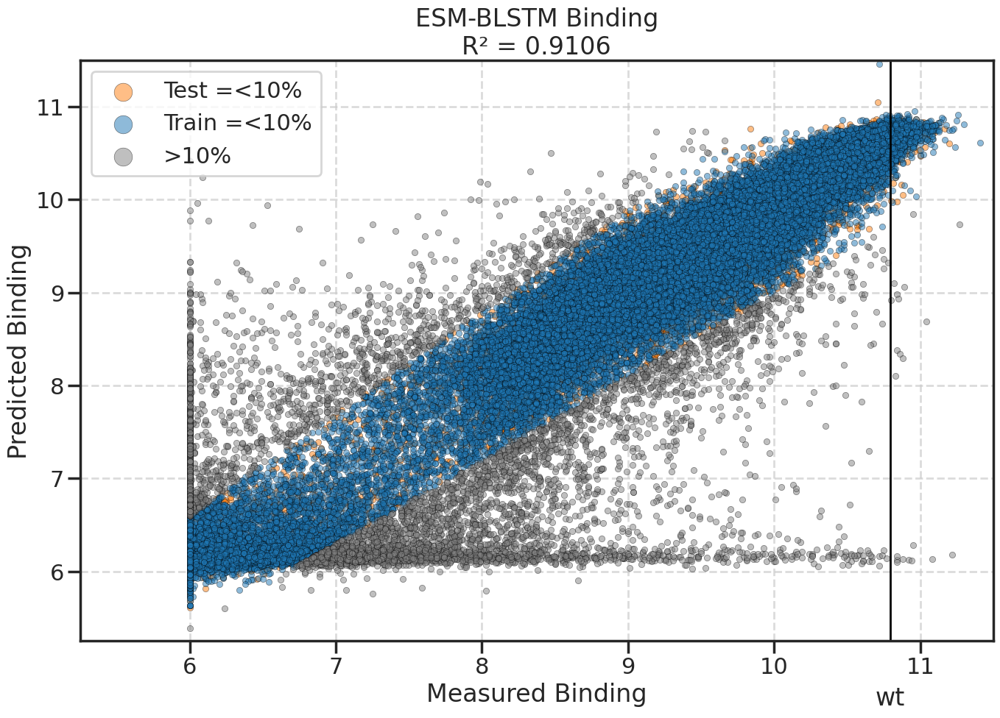

In [4]:
df = pd.read_csv("esm_blstm/esm_blstm.A.binding-predicted_vs_measured.values.csv")
esm_blstm_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.A.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.8209374199548765
R^2 outside of threshold: -0.14308464358127315
R^2 inside of threshold: 0.97233876466063
Number of TRAIN points outside of error threshold: 16233, or 19.75% of all train points
Number of TEST points outside of error threshold: 4378, or 21.18% of all test points


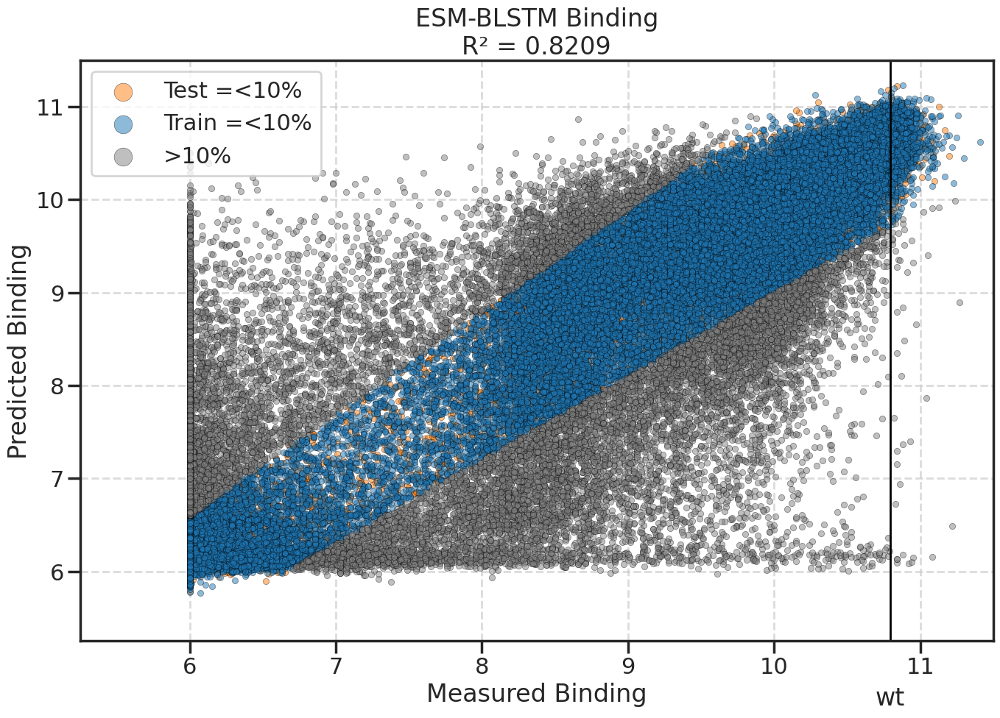

In [5]:
df = pd.read_csv("esm_blstm/esm_blstm.B.binding-predicted_vs_measured.values.csv")
esm_blstm_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.B.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.921120776144194
R^2 outside of threshold: -0.5410789302305314
R^2 inside of threshold: 0.9871724695849683
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 2041, or 9.87% of all test points


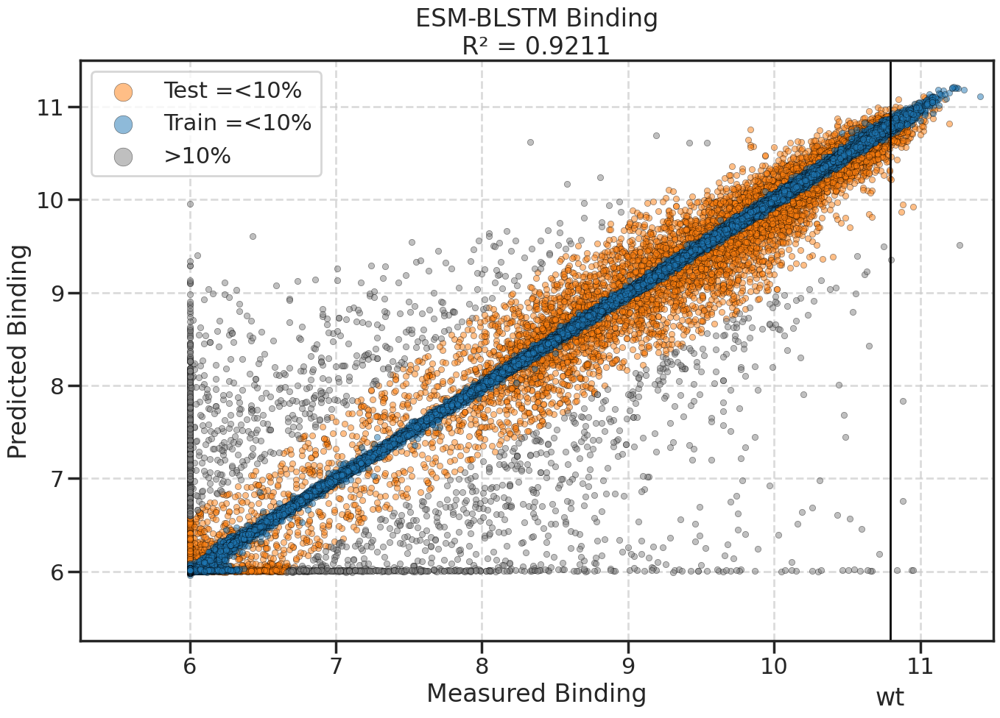

In [6]:
df = pd.read_csv("esm_blstm/esm_blstm.C.binding-predicted_vs_measured.values.csv")
esm_blstm_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.C.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9126981713504689
R^2 outside of threshold: -0.4206549906593662
R^2 inside of threshold: 0.9854005983256341
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 2306, or 11.15% of all test points


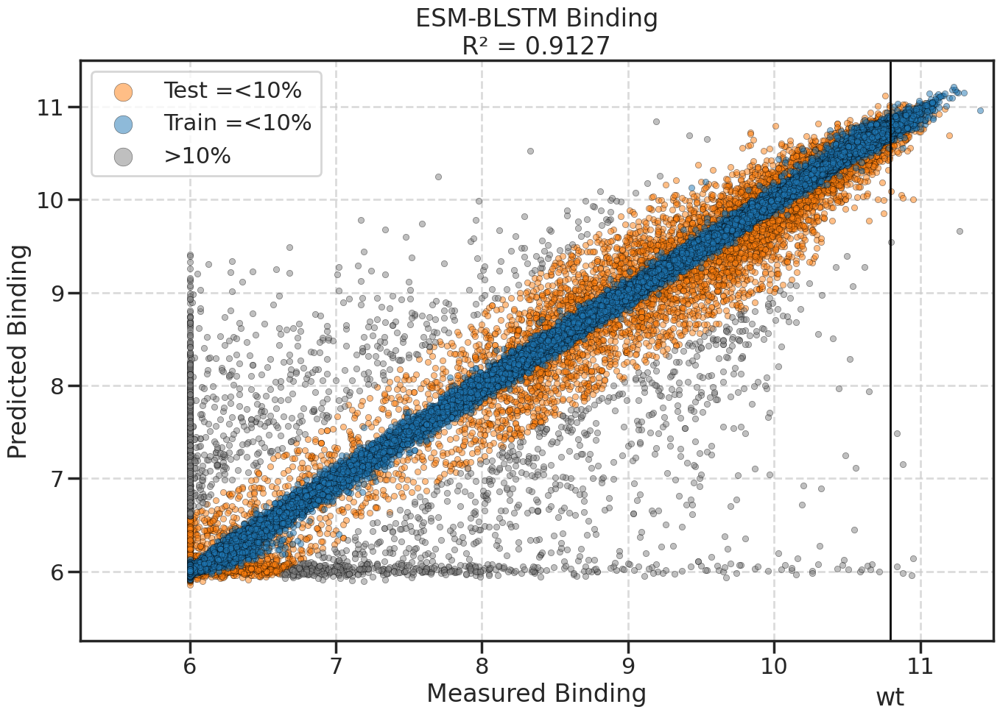

In [7]:
df = pd.read_csv("esm_blstm/esm_blstm.D.binding-predicted_vs_measured.values.csv")
esm_blstm_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.D.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9248482353198942
R^2 outside of threshold: -0.7363113513532442
R^2 inside of threshold: 0.9857620203976302
Number of TRAIN points outside of error threshold: 3631, or 4.42% of all train points
Number of TEST points outside of error threshold: 1699, or 8.22% of all test points


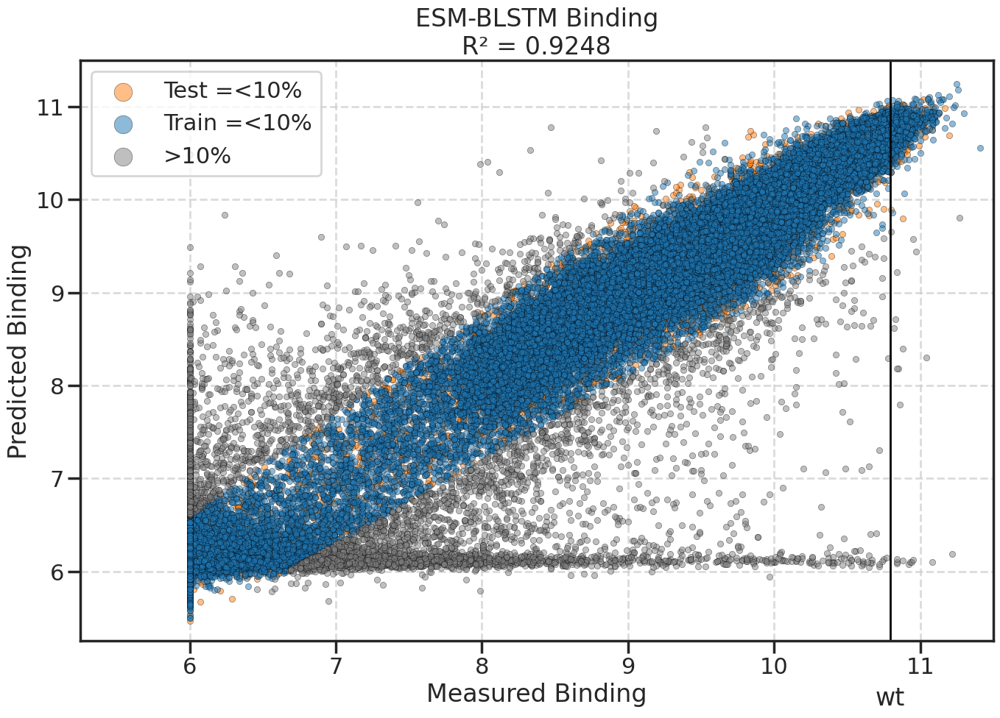

In [8]:
df = pd.read_csv("esm_blstm/esm_blstm.E.binding-predicted_vs_measured.values.csv")
esm_blstm_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.E.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.8788472437273283
R^2 outside of threshold: -0.2630005333095402
R^2 inside of threshold: 0.9766966656419089
Number of TRAIN points outside of error threshold: 10480, or 12.75% of all train points
Number of TEST points outside of error threshold: 2954, or 14.29% of all test points


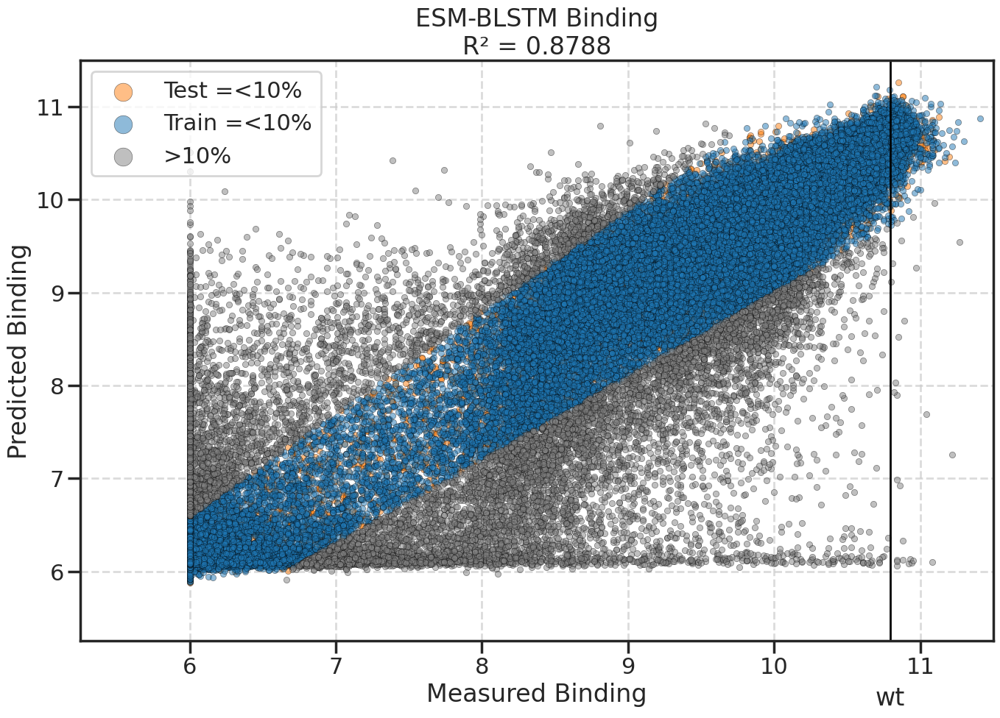

In [9]:
df = pd.read_csv("esm_blstm/esm_blstm.F.binding-predicted_vs_measured.values.csv")
esm_blstm_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.F.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9230848389288832
R^2 outside of threshold: -0.49656703949552394
R^2 inside of threshold: 0.9865120962524704
Number of TRAIN points outside of error threshold: 4, or 0.00% of all train points
Number of TEST points outside of error threshold: 1966, or 9.51% of all test points


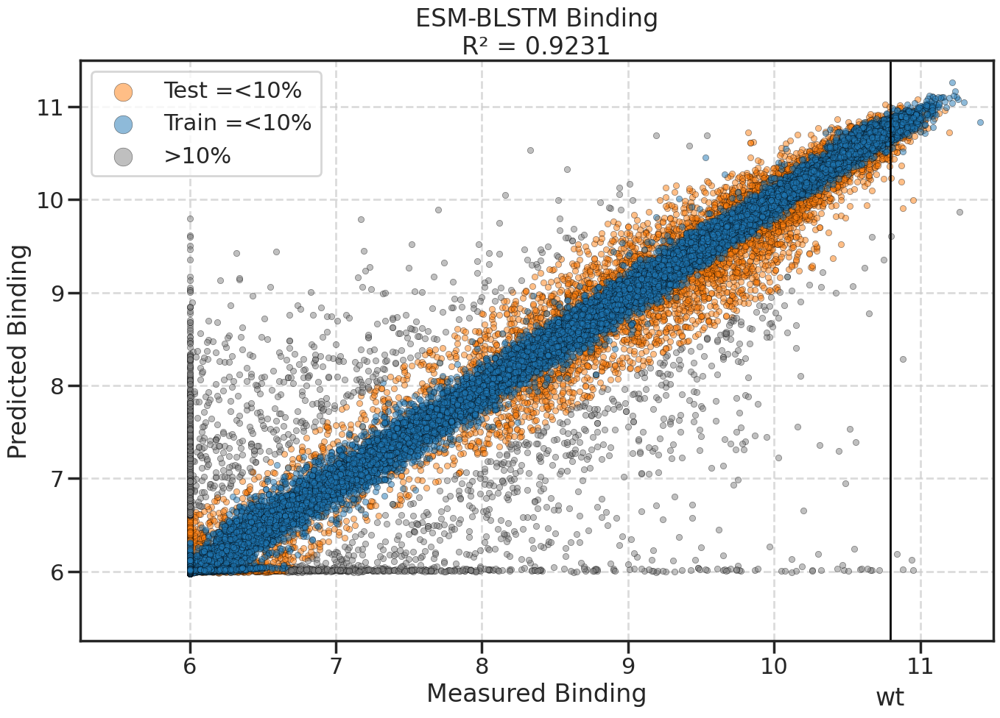

In [10]:
df = pd.read_csv("esm_blstm/esm_blstm.G.binding-predicted_vs_measured.values.csv")
esm_blstm_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.G.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9151670320089442
R^2 outside of threshold: -0.3855959771496349
R^2 inside of threshold: 0.9856717213244316
Number of TRAIN points outside of error threshold: 2, or 0.00% of all train points
Number of TEST points outside of error threshold: 2228, or 10.78% of all test points


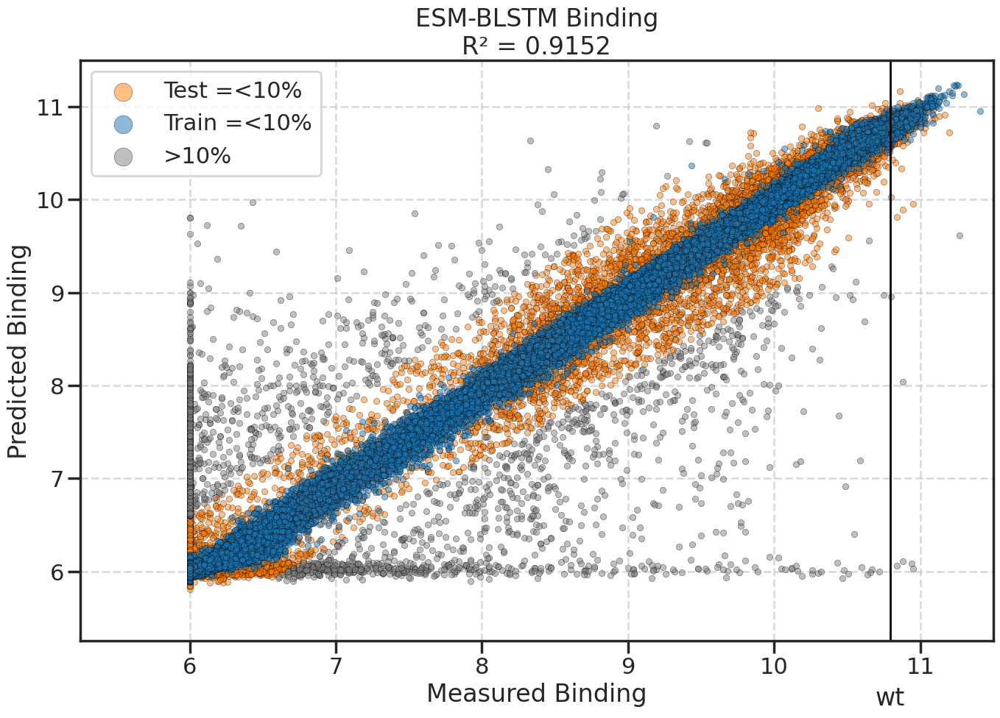

In [11]:
df = pd.read_csv("esm_blstm/esm_blstm.H.binding-predicted_vs_measured.values.csv")
esm_blstm_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-BLSTM Binding", "esm_blstm/esm_blstm.H.binding-predicted_vs_measured.scatter", binding_wt)

Expression

R^2: 0.8767833103988748
R^2 outside of threshold: -0.10782241306399554
R^2 inside of threshold: 0.9145530933727698
Number of TRAIN points outside of error threshold: 986, or 1.20% of all train points
Number of TEST points outside of error threshold: 607, or 2.94% of all test points


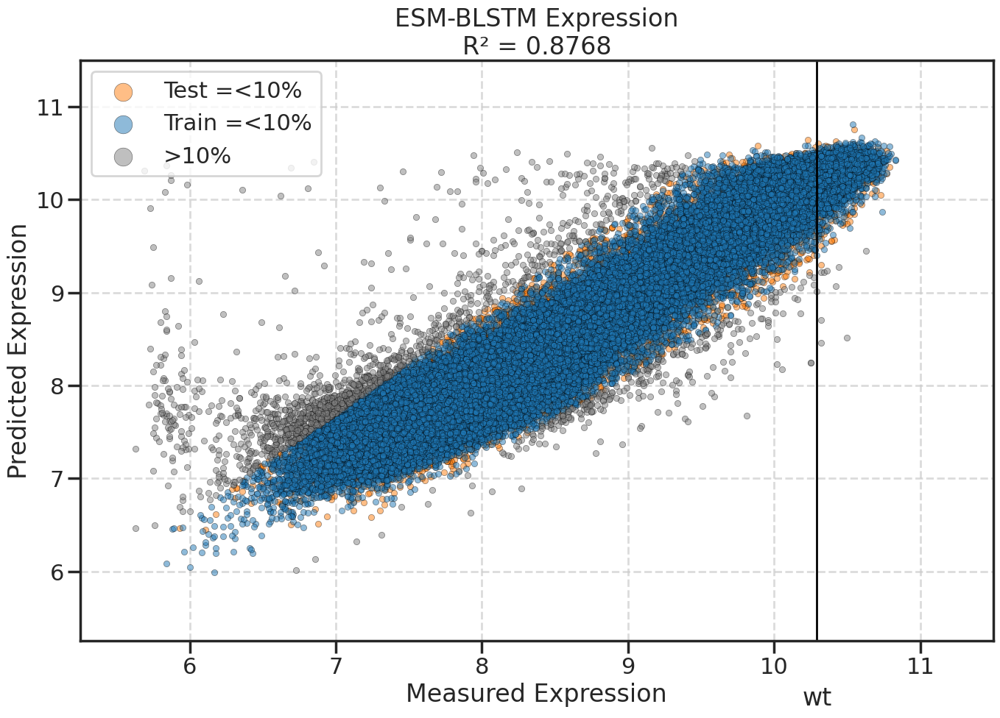

In [12]:
df = pd.read_csv("esm_blstm/esm_blstm.A.expression-predicted_vs_measured.values.csv")
esm_blstm_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.A.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8013708195164242
R^2 outside of threshold: -0.22325807010998733
R^2 inside of threshold: 0.8850238837358055
Number of TRAIN points outside of error threshold: 4264, or 5.19% of all train points
Number of TEST points outside of error threshold: 1281, or 6.20% of all test points


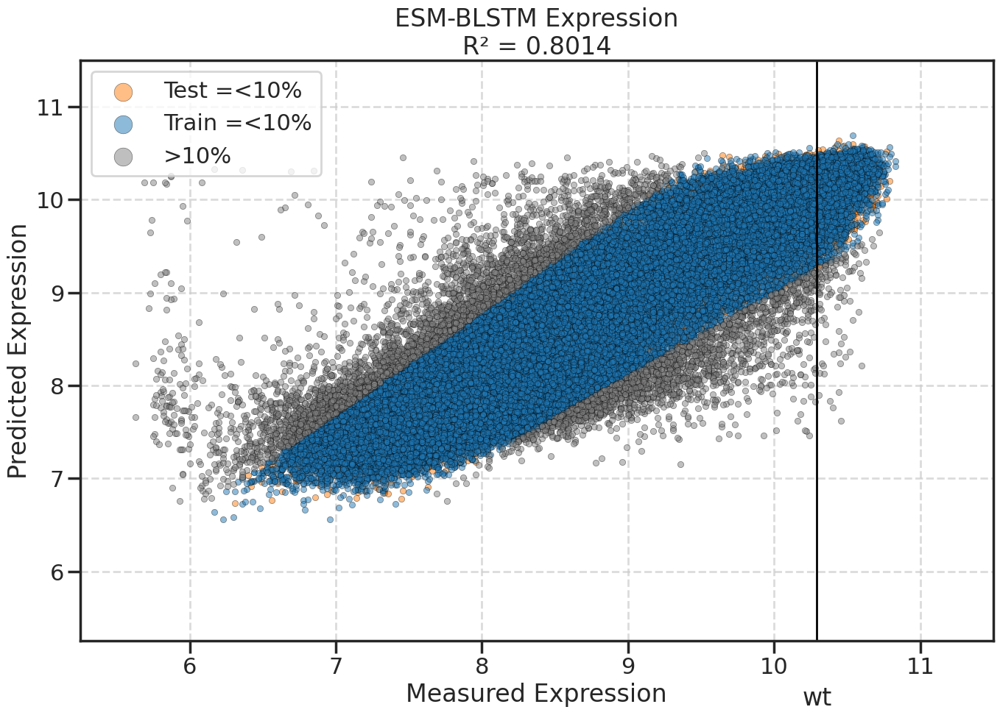

In [13]:
df = pd.read_csv("esm_blstm/esm_blstm.B.expression-predicted_vs_measured.values.csv")
esm_blstm_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.B.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8935589762891742
R^2 outside of threshold: -0.27163033289119354
R^2 inside of threshold: 0.9237187062271904
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 455, or 2.20% of all test points


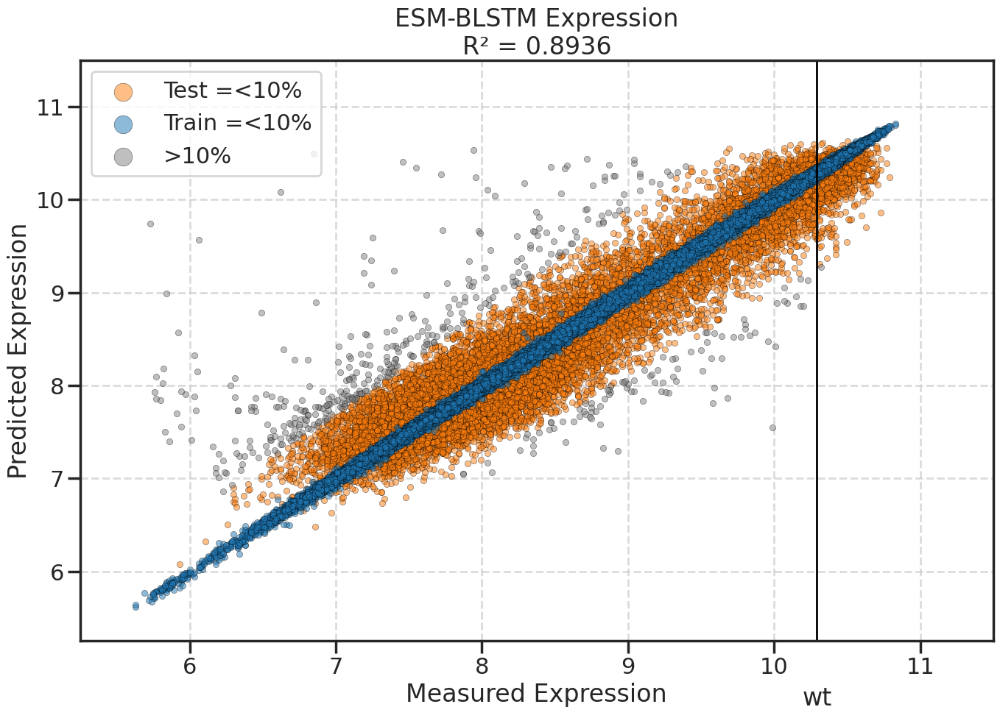

In [14]:
df = pd.read_csv("esm_blstm/esm_blstm.C.expression-predicted_vs_measured.values.csv")
esm_blstm_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.C.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8946060044144558
R^2 outside of threshold: -0.12002969287547116
R^2 inside of threshold: 0.9245375304668901
Number of TRAIN points outside of error threshold: 925, or 1.13% of all train points
Number of TEST points outside of error threshold: 463, or 2.24% of all test points


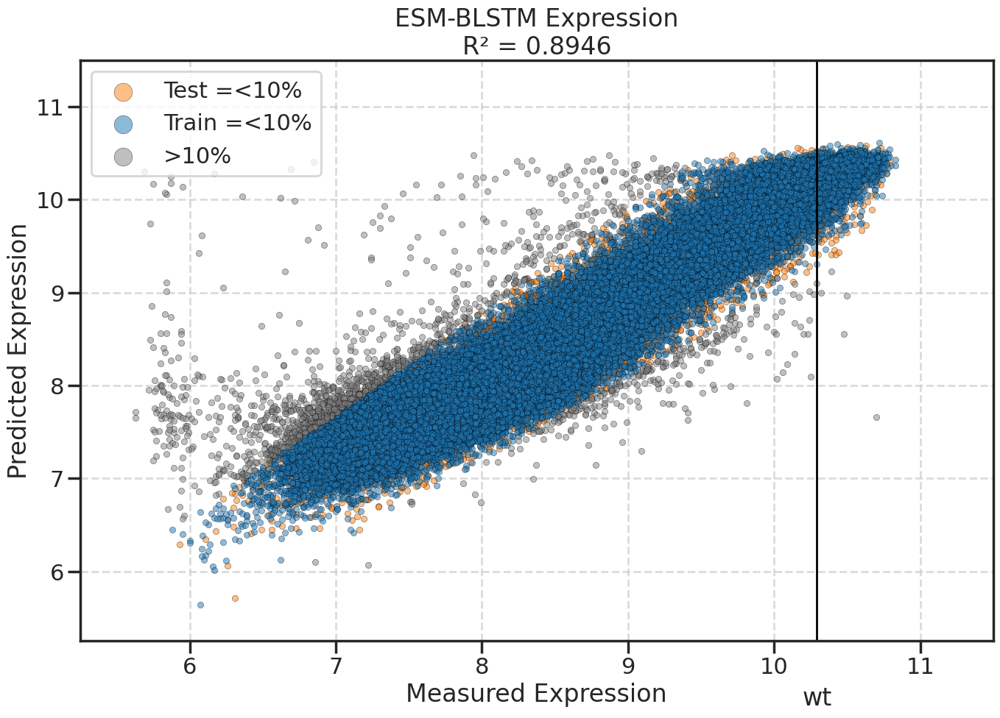

In [15]:
df = pd.read_csv("esm_blstm/esm_blstm.D.expression-predicted_vs_measured.values.csv")
esm_blstm_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.D.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.9011855624283829
R^2 outside of threshold: -0.22680456464304233
R^2 inside of threshold: 0.9291525397999431
Number of TRAIN points outside of error threshold: 763, or 0.93% of all train points
Number of TEST points outside of error threshold: 422, or 2.04% of all test points


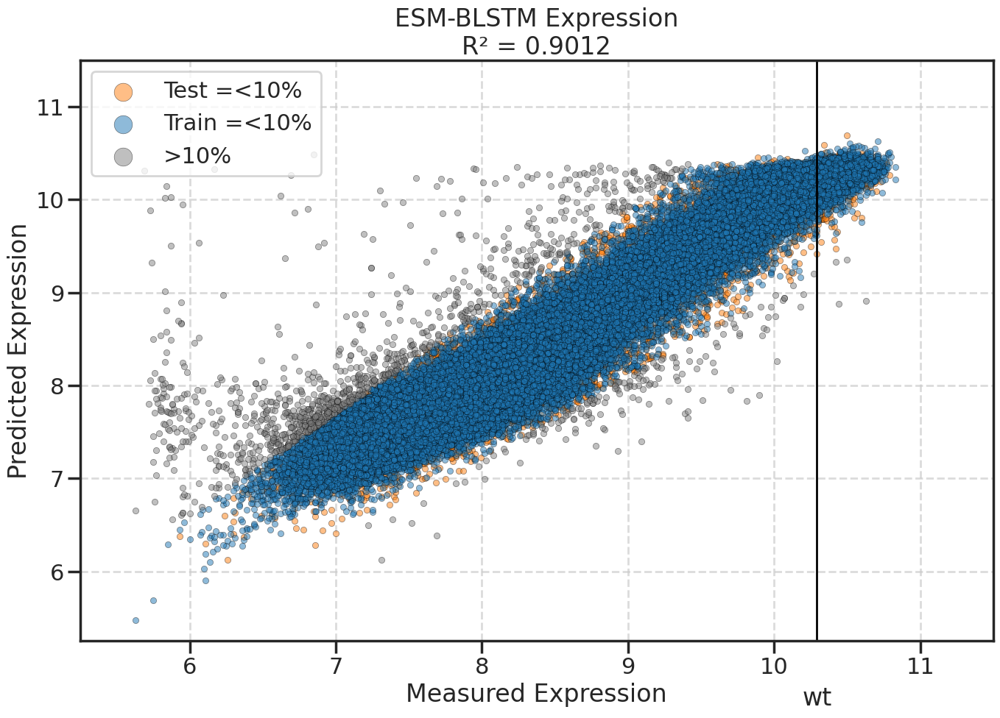

In [16]:
df = pd.read_csv("esm_blstm/esm_blstm.E.expression-predicted_vs_measured.values.csv")
esm_blstm_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.E.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8285001653120028
R^2 outside of threshold: 0.05344166636616943
R^2 inside of threshold: 0.889119902197219
Number of TRAIN points outside of error threshold: 3629, or 4.42% of all train points
Number of TEST points outside of error threshold: 1050, or 5.08% of all test points


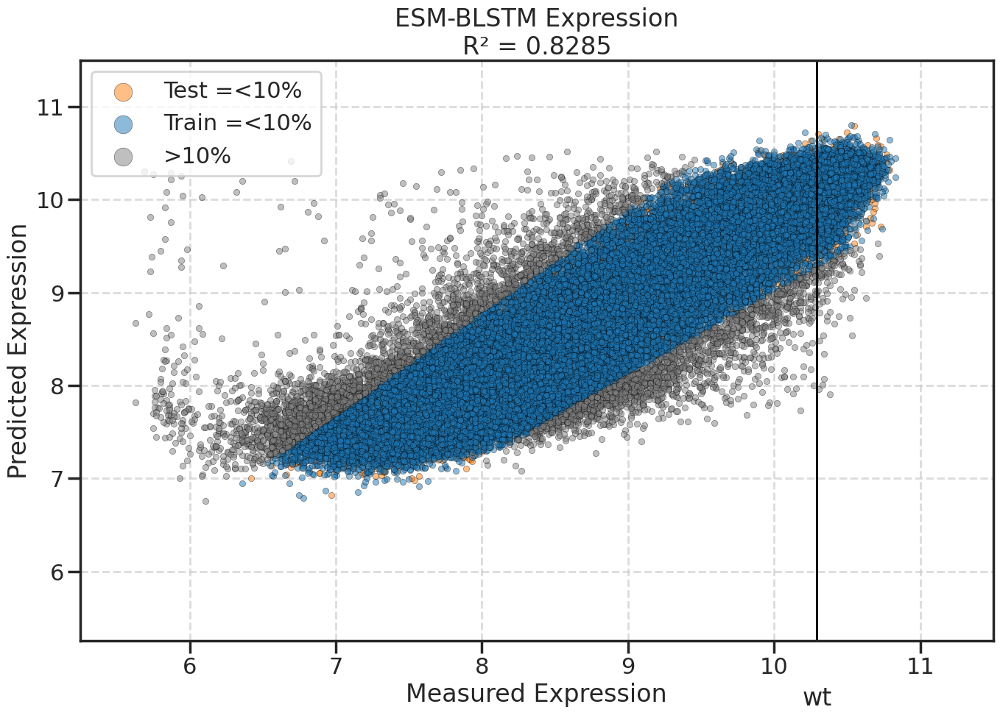

In [17]:
df = pd.read_csv("esm_blstm/esm_blstm.F.expression-predicted_vs_measured.values.csv")
esm_blstm_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.F.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8982506127117833
R^2 outside of threshold: -0.20443271320107415
R^2 inside of threshold: 0.9255965232427557
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 416, or 2.01% of all test points


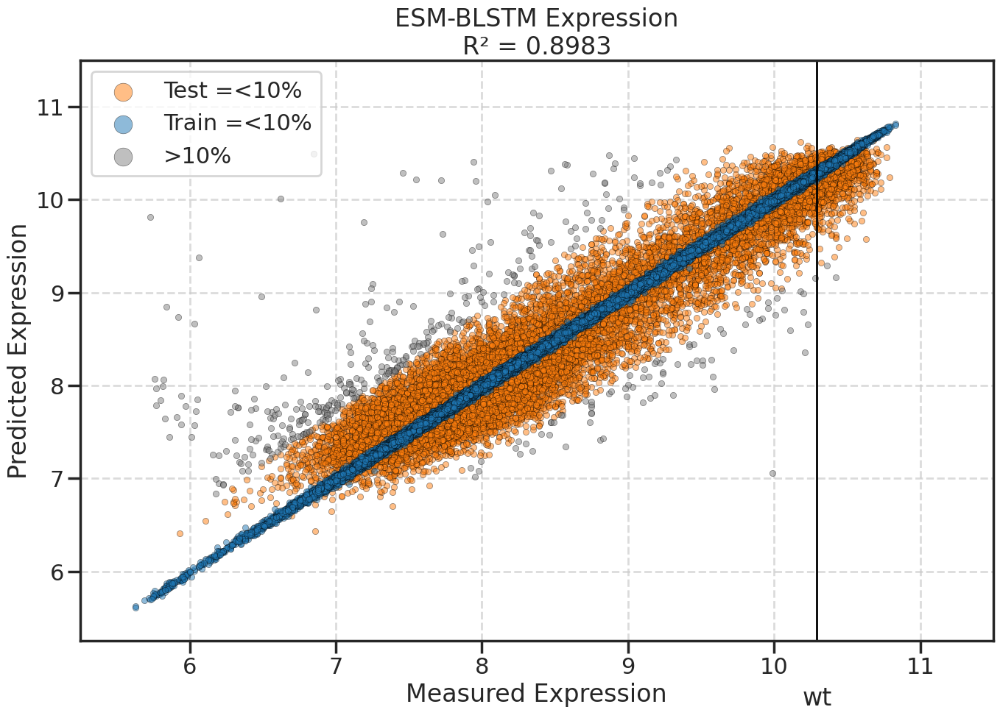

In [18]:
df = pd.read_csv("esm_blstm/esm_blstm.G.expression-predicted_vs_measured.values.csv")
esm_blstm_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.G.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8880466235465627
R^2 outside of threshold: -0.08814734785592027
R^2 inside of threshold: 0.9202504235496254
Number of TRAIN points outside of error threshold: 771, or 0.94% of all train points
Number of TEST points outside of error threshold: 520, or 2.52% of all test points


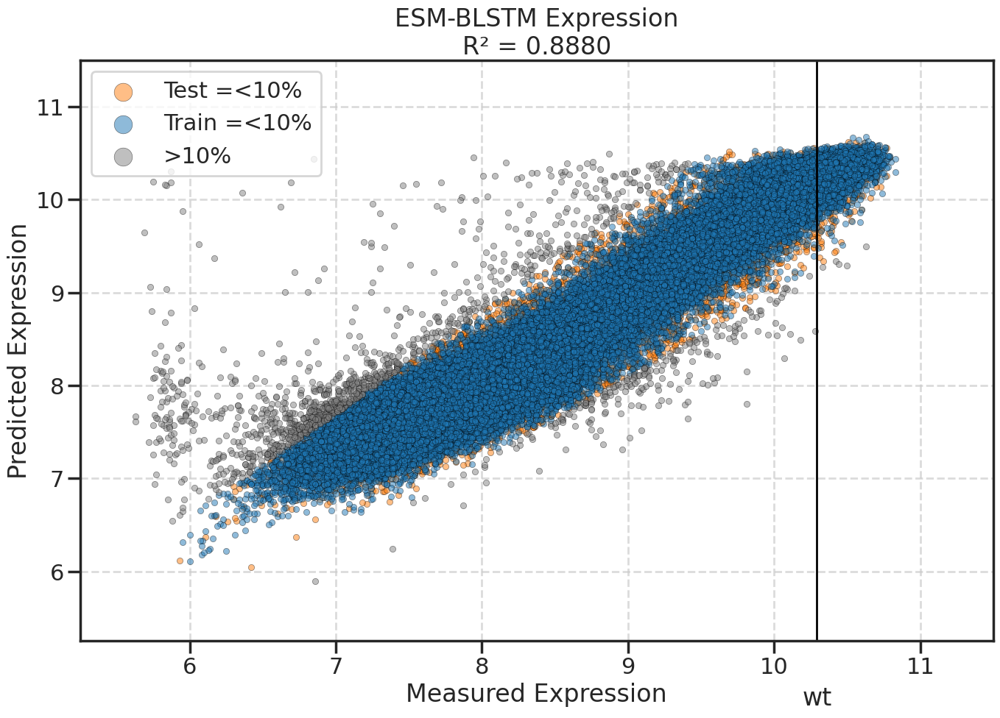

In [19]:
df = pd.read_csv("esm_blstm/esm_blstm.H.expression-predicted_vs_measured.values.csv")
esm_blstm_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-BLSTM Expression", "esm_blstm/esm_blstm.H.expression-predicted_vs_measured.scatter", expression_wt)

In [20]:
r2_dict = {
    "A.binding": esm_blstm_a_binding,
    "A.expression": esm_blstm_a_expression,
    "B.binding": esm_blstm_b_binding,
    "B.expression": esm_blstm_b_expression,
    "C.binding": esm_blstm_c_binding,
    "C.expression": esm_blstm_c_expression,
    "D.binding": esm_blstm_d_binding,
    "D.expression": esm_blstm_d_expression,
    "E.binding": esm_blstm_e_binding,
    "E.expression": esm_blstm_e_expression,
    "F.binding": esm_blstm_f_binding,
    "F.expression": esm_blstm_f_expression,
    "G.binding": esm_blstm_g_binding,
    "G.expression": esm_blstm_g_expression,
    "H.binding": esm_blstm_h_binding,
    "H.expression": esm_blstm_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")

A.binding: 0.9105830508859901
A.expression: 0.8767833103988748
B.binding: 0.8209374199548765
B.expression: 0.8013708195164242
C.binding: 0.921120776144194
C.expression: 0.8935589762891742
D.binding: 0.9126981713504689
D.expression: 0.8946060044144558
E.binding: 0.9248482353198942
E.expression: 0.9011855624283829
F.binding: 0.8788472437273283
F.expression: 0.8285001653120028
G.binding: 0.9230848389288832
G.expression: 0.8982506127117833
H.binding: 0.9151670320089442
H.expression: 0.8880466235465627


---
### Best RMSE Plots (E Binding, E Expression)

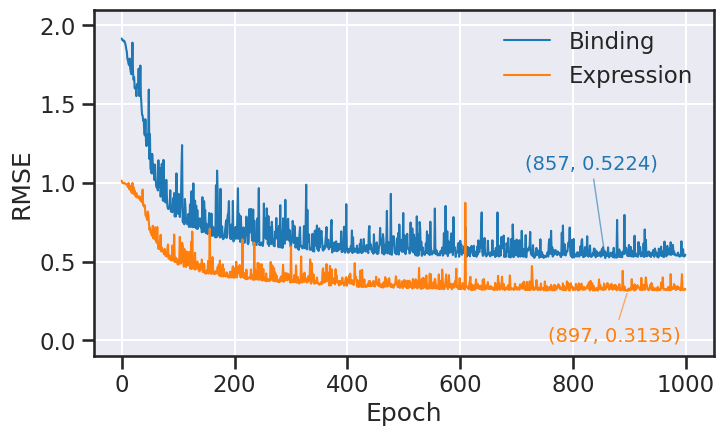

In [6]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../../../src/pnlp/ESM_TL/logs/"
binding_test = os.path.join(log_dir, "esm_blstm/version_21837253/metrics.csv")
expression_test = os.path.join(log_dir, "esm_blstm/version_21837254/metrics.csv")

binding_df = pd.read_csv(
    binding_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
binding_merged_df = binding_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in binding_merged_df.columns:
    binding_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
binding_merged_df.loc[:, "epoch"] = (binding_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
binding_merged_df = binding_merged_df.sort_values("epoch").reset_index(drop=True)
binding_best_epoch = binding_merged_df.loc[binding_merged_df['val_rmse'].idxmin()]

expression_df = pd.read_csv(
    expression_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
expression_merged_df = expression_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in expression_merged_df.columns:
    expression_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
expression_merged_df.loc[:, "epoch"] = (expression_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
expression_merged_df = expression_merged_df.sort_values("epoch").reset_index(drop=True)
expression_best_epoch = expression_merged_df.loc[expression_merged_df['val_rmse'].idxmin()]

# Plot
sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(binding_merged_df['epoch'], binding_merged_df['val_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(expression_merged_df['epoch'], expression_merged_df['val_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)
plt.grid(axis="y", linestyle="-", alpha=1, color='white')
plt.grid(axis="x", linestyle="-", alpha=1, color='white')
ax.set_facecolor('#EAEAF2') 

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, 75), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "../../rmse/best_esm_blstm-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')